This Notebook involves Data analysis of Major indian airlines

In [1]:
#Hi, Lets start with importing the required libraries

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [3]:
#lets read the data
data = pd.read_excel("Airline.xlsx")

In [4]:
#lets check the data
data.head()

,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
0,SpiceJet,SG-8709,Delhi,Evening,zero,Night,Mumbai,Economy,2.17,1,5953
1,SpiceJet,SG-8157,Delhi,Early_Morning,zero,Morning,Mumbai,Economy,2.33,1,5953
2,AirAsia,I5-764,Delhi,Early_Morning,zero,Early_Morning,Mumbai,Economy,2.17,1,5956
3,Vistara,UK-995,Delhi,Morning,zero,Afternoon,Mumbai,Economy,2.25,1,5955
4,Vistara,UK-963,Delhi,Morning,zero,Morning,Mumbai,Economy,2.33,1,5955


In [5]:
#lets check the shape of the data
data.shape

(300153, 11)

In [6]:
#lets check the data types
data.dtypes

airline              object
flight               object
source_city          object
departure_time       object
stops                object
arrival_time         object
destination_city     object
class                object
duration            float64
days_left             int64
price                 int64
dtype: object

In [7]:
#lets check the missing values
data.isnull().sum()

airline             0
flight              0
source_city         0
departure_time      0
stops               0
arrival_time        0
destination_city    0
class               0
duration            0
days_left           0
price               0
dtype: int64

In [8]:
#lets drop the missing values
data = data.dropna()

In [9]:
#lets check the missing values
data.isnull().sum()

airline             0
flight              0
source_city         0
departure_time      0
stops               0
arrival_time        0
destination_city    0
class               0
duration            0
days_left           0
price               0
dtype: int64

In [10]:
#No of flights per airline
data['airline'].value_counts()

airline
Vistara      127859
Air_India     80892
Indigo        43120
GO_FIRST      23173
AirAsia       16098
SpiceJet       9011
Name: count, dtype: int64

In [11]:
#Vistara has the highest number of flights

In [12]:
#lets check the average price of each airline
data.groupby('airline')['price'].mean()

airline
AirAsia       4091.072742
Air_India    23507.019112
GO_FIRST      5652.007595
Indigo        5324.216303
SpiceJet      6179.278881
Vistara      30396.536302
Name: price, dtype: float64

In [13]:
#variation of prices across the airlines
price_by_airline = data.groupby('airline')['price'].mean()
airline = [i for i,df in data.groupby('airline')]

In [14]:
#lets plot the variation of prices across the airlines with plotly
px.bar(x = airline,y=price_by_airline,color=price_by_airline,width=800,height=400,labels={
                     "x": "Airline",
                     "y": "Average Ticket Price"
                 })

Vistara looks too pricey

<Axes: xlabel='airline', ylabel='price'>

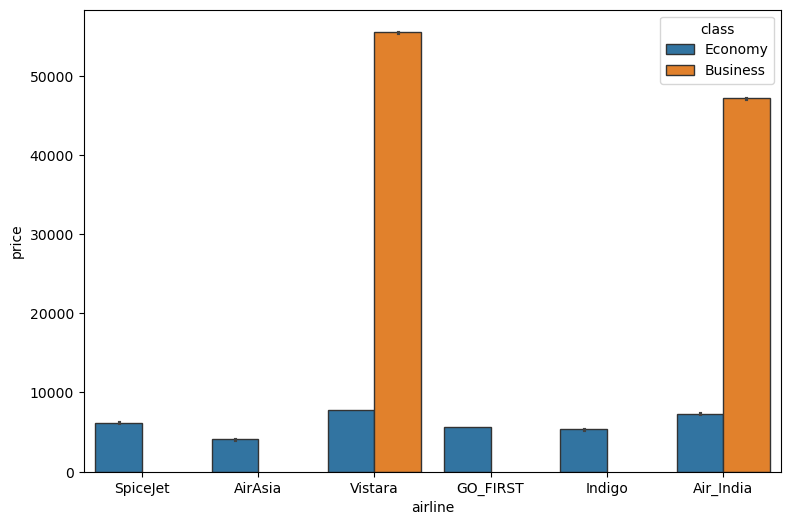

In [15]:
#price variation across the class
plt.figure(figsize=(9,6))
sns.barplot(x = 'airline',y='price',data = data,hue = 'class',edgecolor=".2")

In [16]:
#lets see which source city is more frequently served
count_by_source = data.groupby('source_city').count()['airline']
source_city = [i for i,df in data.groupby('source_city')]
px.pie(values = count_by_source,names=source_city,color_discrete_sequence=px.colors.sequential.dense,width=600,height=400)

In [17]:
#lets see which destination city is more frequently served
count_by_source = data.groupby('destination_city').count()['airline']
destination_city = [i for i,df in data.groupby('destination_city')]
px.pie(values = count_by_source,names=destination_city,color_discrete_sequence=px.colors.sequential.deep,width=600,height=400)

In [18]:
#Which Route is the bussiest route 
route = data.groupby(['source_city','destination_city']).count()['airline']
route = pd.DataFrame(route)
route = route.reset_index()
route.sort_values(by = 'airline',ascending=False).head(10)

,source_city,destination_city,airline
14,Delhi,Mumbai,15289
27,Mumbai,Delhi,14809
10,Delhi,Bangalore,14012
1,Bangalore,Delhi,13756
4,Bangalore,Mumbai,12939
25,Mumbai,Bangalore,12885
29,Mumbai,Kolkata,12602
13,Delhi,Kolkata,11934
24,Kolkata,Mumbai,11467
11,Delhi,Chennai,10780


In [19]:
#Its clear Delhi to Mumbai is the busiest route

In [20]:
data.head()

,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
0,SpiceJet,SG-8709,Delhi,Evening,zero,Night,Mumbai,Economy,2.17,1,5953
1,SpiceJet,SG-8157,Delhi,Early_Morning,zero,Morning,Mumbai,Economy,2.33,1,5953
2,AirAsia,I5-764,Delhi,Early_Morning,zero,Early_Morning,Mumbai,Economy,2.17,1,5956
3,Vistara,UK-995,Delhi,Morning,zero,Afternoon,Mumbai,Economy,2.25,1,5955
4,Vistara,UK-963,Delhi,Morning,zero,Morning,Mumbai,Economy,2.33,1,5955


<Axes: xlabel='stops', ylabel='price'>

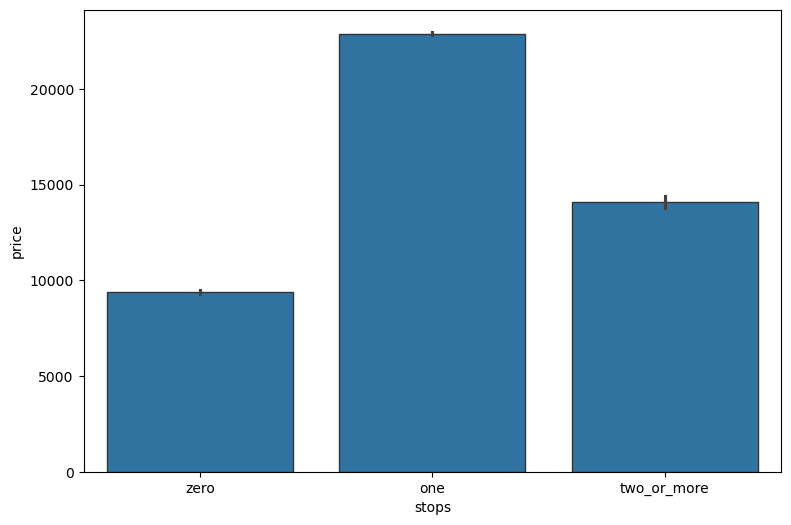

In [21]:
#relation between the price and the number of stops
plt.figure(figsize=(9,6))
sns.barplot(x = 'stops',y='price',data = data,edgecolor=".2")


In [22]:
# Flight with one stop has the highest price

In [23]:
#What are the times at which the cities are operating most of their flights
departure_time = data.groupby('departure_time').count()['airline']
cities = [i for i,df in data.groupby('departure_time')]
px.line(x = cities,y = departure_time,width=900,height=400,labels={'x':"Time of depdarture",'y':'Operating count'},markers=True)

<Axes: xlabel='days_left', ylabel='price'>

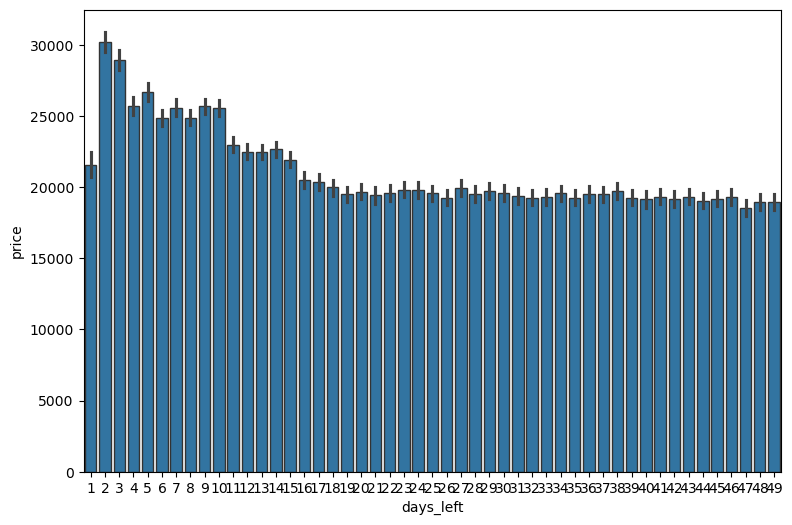

In [24]:
#price differentiation between days left and price
plt.figure(figsize=(9,6))
sns.barplot(x = 'days_left',y='price',data = data,edgecolor=".2")


In [25]:
#this shows that the price is higher when the days left are less

In [26]:
#individual cities and their operating times
cities = [i for i,df in data.groupby('source_city')]
fig = go.Figure()
for i in cities:
    values = data[data['source_city']==i]
    dep_time = [i for i,df in values.groupby('departure_time')]
    values = list(values.groupby('departure_time').count()['airline'].values)
    fig.add_trace(go.Scatter(
    x=dep_time,
    y=values,name = i))
fig.update_layout(
    width=1000,
    height=500,
    paper_bgcolor="LightSteelBlue",
)    
fig.show()   

In [27]:
#Price of ticket based on time of departure
price_by_dep_time = data.groupby('departure_time')['price'].mean()
dep_time = [i for i,df in data.groupby('departure_time')]
values = list(price_by_dep_time.values)

px.bar(x = dep_time,y = values,color = values)

In [28]:
#flights in the latenight are the cheapest

In [29]:
#How does the source city affect the price
fig = make_subplots(rows=1,cols=2)
source_city = list(data.groupby('source_city')['price'].mean().values)
source_cities = [i for i,df in data.groupby('source_city')]
destination_city = list(data.groupby('destination_city')['price'].mean().values)
destination_cities = [i for i,df in data.groupby('destination_city')]
fig.add_trace(go.Bar(y = source_city, x = source_cities,name = "source"),row=1,col=1)
fig.add_trace(go.Bar(y = destination_city, x = destination_cities,name = "destination"),row=1,col=2)

Delhi is the cheapest destination/Source to travel for/from and chennai is the most expensive place to reach or to travel from

In [30]:
   #Price of ticket based on time of departure
price_by_dep_time = data.groupby('departure_time')['price'].mean()
dep_time = [i for i,df in data.groupby('departure_time')]
values = list(price_by_dep_time.values)
px.bar(x = dep_time,y = values,color = values)
#flights in the latenight are the cheapest

In [31]:
#lets consider a source and a destination and check which is the operator that is operating most number of services in that route
#How does the source city affect the price
fig = make_subplots(rows=1,cols=2)
source_city = list(data.groupby('source_city')['price'].mean().values)
source_cities = [i for i,df in data.groupby('source_city')]
destination_city = list(data.groupby('destination_city')['price'].mean().values)
destination_cities = [i for i,df in data.groupby('destination_city')]
fig.add_trace(go.Bar(y = source_city, x = source_cities,name = "source"),row=1,col=1)
fig.add_trace(go.Bar(y = destination_city, x = destination_cities,name = "destination"),row=1,col=2)

In [32]:
#Delhi is the cheapest destination/Source to travel for/from and chennai is the most expensive place to reach or to travel from

#### How does the number of stops effect the price??

<Axes: xlabel='stops', ylabel='price'>

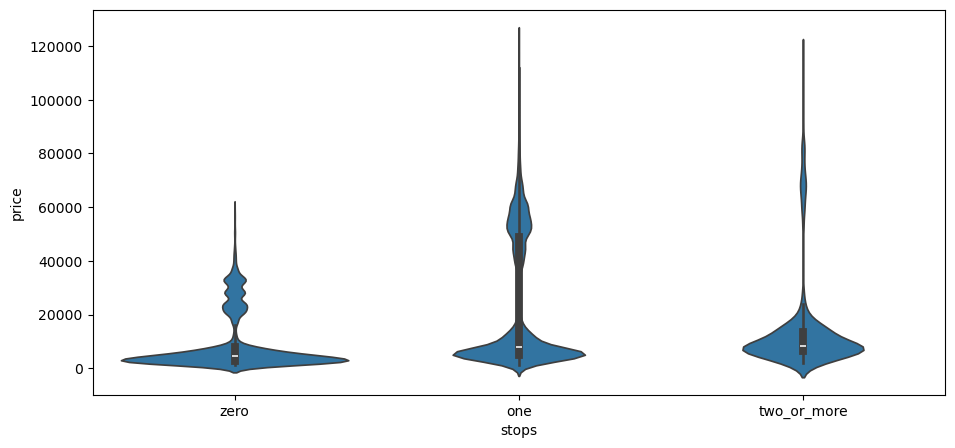

In [33]:
data['stops'].value_counts()
data_copy = data.copy()
plt.figure(figsize=(11,5))
sns.violinplot(x = data_copy['stops'],y = data_copy['price'])

In [34]:
#There are 2 bumps in each distribustions in each case beacuse we have business and economy classes

In [35]:
#we cannot go by this beacuse business class might drag the prices up
data_copy.groupby(['stops'])['price'].mean()

stops
one            22900.992482
two_or_more    14113.450775
zero            9375.938535
Name: price, dtype: float64

In [36]:
economy = data_copy[data_copy['class']=='Economy']

In [37]:
businesss = data_copy[data_copy['class']=='Business']

In [38]:
economy

,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
0,SpiceJet,SG-8709,Delhi,Evening,zero,Night,Mumbai,Economy,2.17,1,5953
1,SpiceJet,SG-8157,Delhi,Early_Morning,zero,Morning,Mumbai,Economy,2.33,1,5953
2,AirAsia,I5-764,Delhi,Early_Morning,zero,Early_Morning,Mumbai,Economy,2.17,1,5956
3,Vistara,UK-995,Delhi,Morning,zero,Afternoon,Mumbai,Economy,2.25,1,5955
4,Vistara,UK-963,Delhi,Morning,zero,Morning,Mumbai,Economy,2.33,1,5955
...,...,...,...,...,...,...,...,...,...,...,...
206661,Vistara,UK-832,Chennai,Early_Morning,one,Night,Hyderabad,Economy,13.83,49,7697
206662,Vistara,UK-832,Chennai,Early_Morning,one,Night,Hyderabad,Economy,13.83,49,7709
206663,Vistara,UK-826,Chennai,Afternoon,one,Morning,Hyderabad,Economy,20.58,49,8640
206664,Vistara,UK-822,Chennai,Morning,one,Morning,Hyderabad,Economy,23.33,49,8640


In [39]:
fig = make_subplots(rows=1,cols=2)
fig.add_trace(go.Bar(x = list(economy['stops']),y = economy['price']),row=1,col=1)
fig.add_trace(go.Bar(x = businesss['stops'],y = businesss['price']),row=1,col=2)

More stops will lead to more expensive ticket fares and that can be clearly seen above
lets see how the number of days left affect the price

In [40]:
price = list(data.groupby('days_left')['price'].mean().values)
days = [i for i,df in data.groupby('days_left')]
px.scatter(x = days,y = price,color=price,labels = {'x':'Days_left','y':'Price'})

Just one day before the price has fallen drastically to fill the empty seats and to get at a cheaper rate we should book our tickets atleast 20 days before the journey
lets see how duration affects the price

In [41]:
#To get some stable obesrvations lets check the relation when the days left are atleast 20
data_copy = data[data['days_left']>20]
values = list(data_copy.groupby('duration')['price'].mean().values)
duration = [i for i,df in data_copy.groupby('duration')]
px.scatter(x = duration,y = values,color=duration)

In [42]:
#Clearly there are some oultier beacuse it wont take 30 hours to reach from one place to other via plane atleast in india... LOL

In [43]:
#airline and the frequent operator
grouped = data.groupby(['source_city','destination_city','airline']).count()['duration']
grouped = pd.DataFrame(grouped)
grouped = grouped.reset_index()
grouped

,source_city,destination_city,airline,duration
0,Bangalore,Chennai,AirAsia,138
1,Bangalore,Chennai,Air_India,1610
2,Bangalore,Chennai,GO_FIRST,369
3,Bangalore,Chennai,Indigo,282
4,Bangalore,Chennai,SpiceJet,58
...,...,...,...,...
172,Mumbai,Kolkata,Air_India,3478
173,Mumbai,Kolkata,GO_FIRST,1150
174,Mumbai,Kolkata,Indigo,1690
175,Mumbai,Kolkata,SpiceJet,973


In [44]:
source_cities = list(grouped['source_city'].unique())
source_cities

['Bangalore', 'Chennai', 'Delhi', 'Hyderabad', 'Kolkata', 'Mumbai']

In [45]:
destination_cities = list(grouped['destination_city'].unique())
destination_cities
data.iloc[0].values[0]

'SpiceJet'

In [46]:
empty_data = pd.DataFrame(columns=['source','destination','airline'])
count = 0
for index,i in enumerate(source_cities):
    destinations = [j for j in destination_cities if j not in [i]]
    test_data = data[data['source_city']==i]
    for dest in destinations:
        work = test_data.copy()
        work = work[work['destination_city']==dest]
        airline = work.sort_values(by = 'duration',ascending=False).iloc[0].values[0]
        empty_data.loc[count] = [i,dest,airline]
        count+=1
empty_data.head()
px.pie(empty_data,names = list(empty_data['airline'].value_counts().index) ,values = list(empty_data['airline'].value_counts().values),width=600,height=400)


out of 29 Routes that we have 66% of the routes have Air India as the most operated airline followed by vistara

### Model Creation

In [47]:
#We will be using the following regression algorithims

In [48]:
data.head()

,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
0,SpiceJet,SG-8709,Delhi,Evening,zero,Night,Mumbai,Economy,2.17,1,5953
1,SpiceJet,SG-8157,Delhi,Early_Morning,zero,Morning,Mumbai,Economy,2.33,1,5953
2,AirAsia,I5-764,Delhi,Early_Morning,zero,Early_Morning,Mumbai,Economy,2.17,1,5956
3,Vistara,UK-995,Delhi,Morning,zero,Afternoon,Mumbai,Economy,2.25,1,5955
4,Vistara,UK-963,Delhi,Morning,zero,Morning,Mumbai,Economy,2.33,1,5955


1. Linear regression
2. KNN Regressor
3. Gradient Boost Regressor
4. XG Boost Regressor
5. Decesion Tree Regressor
6. SVM Regression

In [49]:
#Lets encode the categorical data into numerical data
final_data = data.copy()
final_data.head()





,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
0,SpiceJet,SG-8709,Delhi,Evening,zero,Night,Mumbai,Economy,2.17,1,5953
1,SpiceJet,SG-8157,Delhi,Early_Morning,zero,Morning,Mumbai,Economy,2.33,1,5953
2,AirAsia,I5-764,Delhi,Early_Morning,zero,Early_Morning,Mumbai,Economy,2.17,1,5956
3,Vistara,UK-995,Delhi,Morning,zero,Afternoon,Mumbai,Economy,2.25,1,5955
4,Vistara,UK-963,Delhi,Morning,zero,Morning,Mumbai,Economy,2.33,1,5955


In [50]:
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()

In [51]:
from sklearn.model_selection import train_test_split

In [52]:
from sklearn.preprocessing import LabelEncoder

# Step 1: Identify columns with mixed types
for column in final_data.columns:
    unique_types = final_data[column].apply(type).nunique()
    if unique_types > 1:
        print(f"Column '{column}' has mixed types.")

# Step 2: Convert all object-type columns to strings
for column in final_data.select_dtypes(include=['object']).columns:
    final_data[column] = final_data[column].astype(str)

# Step 3: Apply LabelEncoder to all object columns
for column in final_data.select_dtypes(include=['object']).columns:
    encoder = LabelEncoder()
    final_data[column] = encoder.fit_transform(final_data[column])

# Step 4: Verify the encoded data
print(final_data.head())


Column 'flight' has mixed types.
   airline  flight  source_city  departure_time  stops  arrival_time  \
0        4    1408            2               2      2             5   
1        4    1387            2               1      2             4   
2        0    1213            2               1      2             1   
3        5    1559            2               4      2             0   
4        5    1549            2               4      2             4   

   destination_city  class  duration  days_left  price  
0                 5      1      2.17          1   5953  
1                 5      1      2.33          1   5953  
2                 5      1      2.17          1   5956  
3                 5      1      2.25          1   5955  
4                 5      1      2.33          1   5955  


In [53]:
for i in final_data.select_dtypes('object').columns:
    encoder = LabelEncoder()
    final_data[i] = encoder.fit_transform(data[i])

In [54]:
final_data.drop('flight',axis=1,inplace=True)

In [55]:
final_data

,airline,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
0,4,2,2,2,5,5,1,2.17,1,5953
1,4,2,1,2,4,5,1,2.33,1,5953
2,0,2,1,2,1,5,1,2.17,1,5956
3,5,2,4,2,0,5,1,2.25,1,5955
4,5,2,4,2,4,5,1,2.33,1,5955
...,...,...,...,...,...,...,...,...,...,...
300148,5,1,4,0,2,3,0,10.08,49,69265
300149,5,1,0,0,5,3,0,10.42,49,77105
300150,5,1,1,0,5,3,0,13.83,49,79099
300151,5,1,1,0,2,3,0,10.00,49,81585


In [56]:
#train_test_split
X_train, X_test, y_train, y_test = train_test_split(final_data.drop('price',axis=1),final_data['price'], test_size=0.33, random_state=42)

In [57]:
#importing all the models

from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
import xgboost as xgb

##### Kfold Cross Validation on all the models(Using a kfold of size = 5)

In [58]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

In [59]:
models = {}

models["KNeighborsRegressor"]={"model":KNeighborsRegressor(n_neighbors=50)}
models["LinearRegression"]={"model":LinearRegression()}
models["XGBRegressor"]={"model":xgb.XGBRegressor(n_jobs=5,learning_rate=0.1,max_depth=10,random_state=1)}
models["RandomForestRegressor"]={"model":RandomForestRegressor(n_estimators=50,max_depth=10)}
models['GradientBoostingRegressor'] = {'model':GradientBoostingRegressor(n_estimators=50,max_depth=10)}

In [60]:
X = final_data.drop('price',axis=1)
y = final_data['price']

### Manual KFold Cross Validation

In [61]:
# def get_score(model,xtrain,xtest,ytrain,ytest):
#     model.fit(xtrain,ytrain)
#     score = model.socre(xtest,ytest)
#     return score

# for train_index,test_index in cv.split(X,y):
#     xtrain = X.loc[train_index]
#     ytrain = y.loc[train_index]
#     xtest = X.loc[test_index]
#     ytest = y.loc[test_index]
#     print(get_scores(model,xtrain,xtest,ytrain,ytest))

### Automatic Kfold Cross validation

In [62]:
#cross validation to get the best model
cv = KFold(n_splits=5)
for key,item in models.items():
    reg_model = item['model']
    print(item['model'])
    score = cross_val_score(estimator=reg_model,X = X,y = y,cv=cv,scoring='r2')
    print(score)

KNeighborsRegressor(n_neighbors=50)
[-2.10678338e+01 -3.51047132e+01 -3.31635500e+01 -2.40903156e-02
 -9.31740333e+00]
LinearRegression()
[-0.2069986  -0.2036236  -0.15840652  0.83777416  0.07672315]
XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=10, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=5,
             num_parallel_tree=None, random_state=1, ...)
[0.57158303 0.54647994 0.61689579 0.89248949 0.08876717]
Rando

In [63]:
#Clearly the Gradient Boosting algorithm does better in estimating, let us explore

In [64]:
reg_model.fit(X_train,y_train)

GradientBoostingRegressor(max_depth=10, n_estimators=50)

In [65]:
predicted = reg_model.predict(X_test)

In [66]:
predicted

array([ 5259.75216235, 70466.67042687,  7357.32846382, ...,
        4201.79895998,  6442.05915916, 11520.03964379])

In [67]:
actual_values = y_test.values

In [68]:
actual_values

array([ 7366, 64831,  6195, ...,  5511,  5760, 11129], dtype=int64)

In [69]:
from sklearn.metrics import mean_absolute_error

In [70]:
mean_absolute_error(actual_values,predicted)

1924.9057934700613

In [71]:
reg_model.score(X_test,y_test)

0.9761388726032245

#### Hyper parameter tuning using gridsearch cv

In [72]:
#The below code has already been implemented so we directly use the best parameters

In [73]:
# grid_params = {'min_samples_split':[1,2,3,4],'min_samples_leaf':[1,2,3],'max_depth':[4,6,8,10],'n_estimators':[40,50,100]}

# from sklearn.model_selection import GridSearchCV
# grid = GridSearchCV(estimator=GradientBoostingRegressor(),param_grid=grid_params,n_jobs=-1,verbose=3)

# grid.fit(X_train,y_train)

In [74]:
# best parameters are
# {'max_depth': 10,
#  'min_samples_leaf': 1,
#  'min_samples_split': 2,
#  'n_estimators': 100}

In [75]:
final_model = GradientBoostingRegressor(max_depth=100,min_samples_leaf=1,min_samples_split=2,n_estimators=100)

In [76]:
final_model.fit(X_train,y_train)

GradientBoostingRegressor(max_depth=100)

In [77]:
final_model.score(X_test,y_test)

0.9760861627374549

In [78]:
#Final predictions
Predictions = final_model.predict(X_test)
Actual = y_test.values

<Axes: >

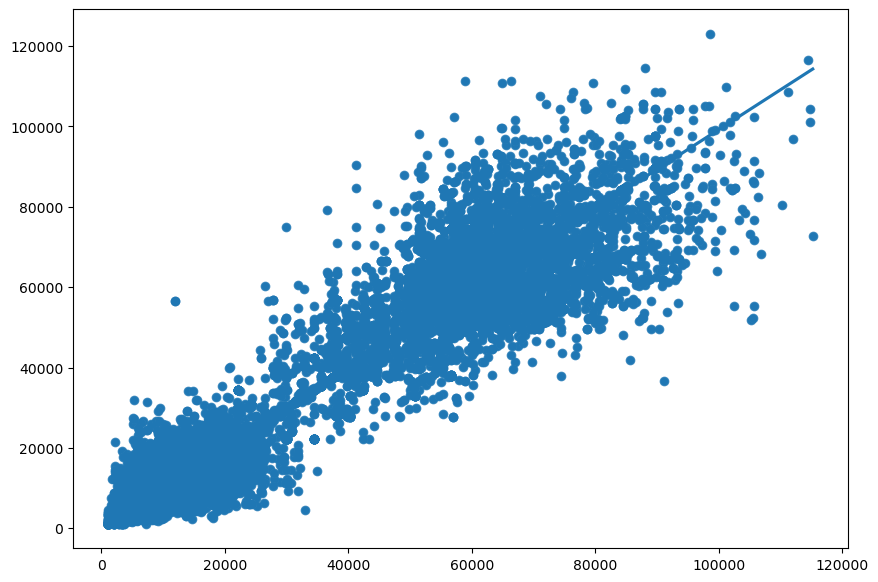

In [79]:
plt.figure(figsize=(10,7))
sns.scatterplot(x = Actual,y = Predictions)
sns.regplot(x = Actual,y = Predictions)

In [80]:
#Most of the data is along the reg fit but may be due to cause of some outliers some predictions are off